# Leaf Disease Detection

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.applications.vgg16 import VGG16
import seaborn as sns
from tensorflow.keras import Sequential
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Flatten,Dense,MaxPooling2D,Conv2D,Dropout
from keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import img_to_array,load_img
from sklearn.metrics import confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation, Conv2D 
from tensorflow.keras.regularizers import l2

c:\Users\ahmed\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\__init__.py:177: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
training_path = 'Dataset/Train/Train'
testing_path = 'Dataset/Test/Test'
validation_path = 'Dataset/Validation/Validation'

## Getting the Data

In [3]:
training_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255
                                                                     , shear_range=0.2
                                                                     , zoom_range=0.2
                                                                     , horizontal_flip=True)
training_data = training_generator.flow_from_directory(training_path, target_size=(224, 224), batch_size=1322)
validation_data = training_generator.flow_from_directory(validation_path, target_size=(224, 224), batch_size=60)

Found 1322 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [4]:
testing_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
testing_data = testing_generator.flow_from_directory(testing_path, target_size=(224, 224), batch_size=150)

Found 150 images belonging to 3 classes.


In [5]:
X_train, y_train = next(training_data)
X_val, y_val = next(validation_data)
X_test, y_test = next(testing_data)

In [6]:
print("Training Data Shape: ", X_train.shape)
print("Validation Data Shape: ", X_val.shape)
print("Testing Data Shape: ", X_test.shape)

Training Data Shape:  (1322, 224, 224, 3)
Validation Data Shape:  (60, 224, 224, 3)
Testing Data Shape:  (150, 224, 224, 3)


In [7]:
labels = training_data.class_indices
print("Labels: ", labels)

Labels:  {'Healthy': 0, 'Powdery': 1, 'Rust': 2}


In [8]:
def find_key_by_value(target_value):
    # Iterate over each key-value pair in the 'labels' dictionary
    for key, value in labels.items():
        # Check if the current value matches the target_value
        if value == target_value:
            # Return the key corresponding to the matching value
            return key
    # If no matching value is found, implicitly return None

In [9]:
def predict_leaf_disease(predictions):
    plt.figure(figsize=(20,20))
    for n, i in enumerate(np.random.randint(0, len(X_test), 10)):
        plt.subplot(5, 5, n+1)
        plt.imshow(X_test[i])
        plt.title(f"Actual: {find_key_by_value(np.argmax(y_test[i]))} \n Predicted: {find_key_by_value(np.argmax(predictions[i]))}")
        plt.axis('off')

## Visualizing the Data

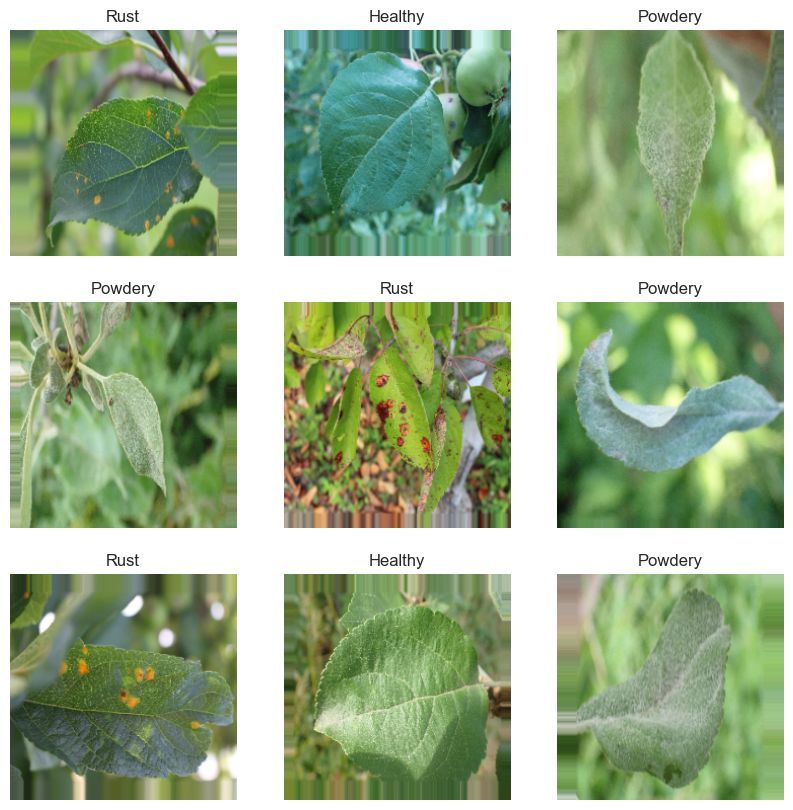

In [9]:
plt.figure(figsize=(10, 10))
# loop through random 9 images
for n, i in enumerate(np.random.randint(0, X_train.shape[0], 9)):
    plt.subplot(3, 3, n+1)
    plt.imshow(X_train[i])
    plt.title(find_key_by_value(np.argmax(y_train[i])))
    plt.axis('off')

## CNN Model Architecture

In [48]:
model = Sequential(
    [
        Conv2D(64, (3, 3), input_shape=(224, 224, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(3, activation='softmax')
    ]
)

## Plotting the Model

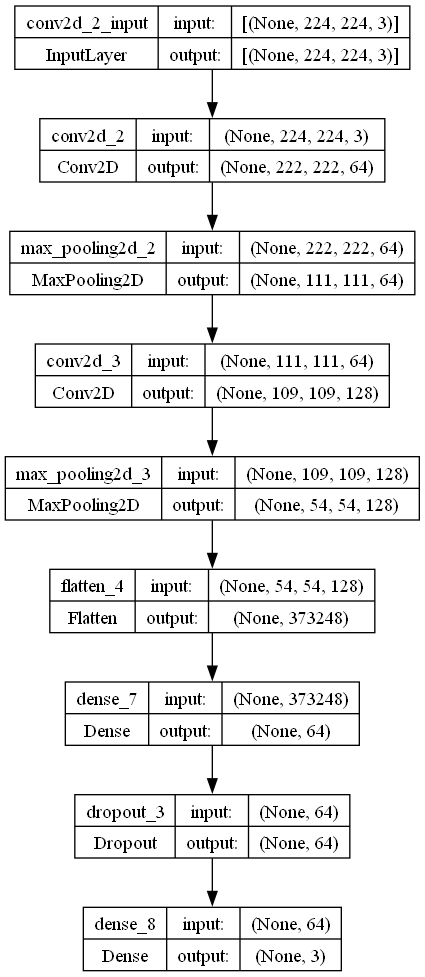

In [49]:
plot_model(model, show_shapes=True, show_layer_names=True)

## Compiling the Model
### Optimizer: Adam
### Loss: Categorical Crossentropy

In [50]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [51]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
fit_model = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[early_stopping], batch_size=16)

Epoch 1/10
83/83 [==============================] - 22s 257ms/step - loss: 0.9416 - accuracy: 0.6210 - val_loss: 0.8927 - val_accuracy: 0.6333
Epoch 2/10
83/83 [==============================] - 9s 102ms/step - loss: 0.4524 - accuracy: 0.8623 - val_loss: 0.7482 - val_accuracy: 0.7167
Epoch 3/10
83/83 [==============================] - 4s 47ms/step - loss: 0.4072 - accuracy: 0.8442 - val_loss: 0.6923 - val_accuracy: 0.7833
Epoch 4/10
83/83 [==============================] - 4s 47ms/step - loss: 0.2930 - accuracy: 0.9054 - val_loss: 0.6217 - val_accuracy: 0.8000
Epoch 5/10
83/83 [==============================] - 4s 47ms/step - loss: 0.2374 - accuracy: 0.9251 - val_loss: 0.6401 - val_accuracy: 0.7833
Epoch 6/10
83/83 [==============================] - 4s 47ms/step - loss: 0.2844 - accuracy: 0.9047 - val_loss: 0.5264 - val_accuracy: 0.8167
Epoch 7/10
83/83 [==============================] - 4s 47ms/step - loss: 0.1797 - accuracy: 0.9418 - val_loss: 0.6429 - val_accuracy: 0.8667
Epoch 8/10

## Plotting Performance Metrics

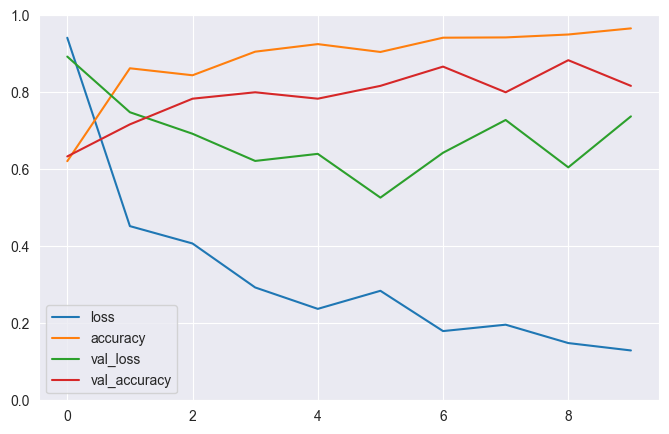

In [52]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [56]:
cnn_predictions = model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
cnn_accuracy = model.evaluate(X_test, y_test, verbose=1)
print("CNN Accuracy: ", cnn_accuracy)

5/5 [==============================] - 0s 26ms/step - loss: 0.4707 - accuracy: 0.8600
CNN Accuracy:  [0.4706808924674988, 0.8600000143051147]


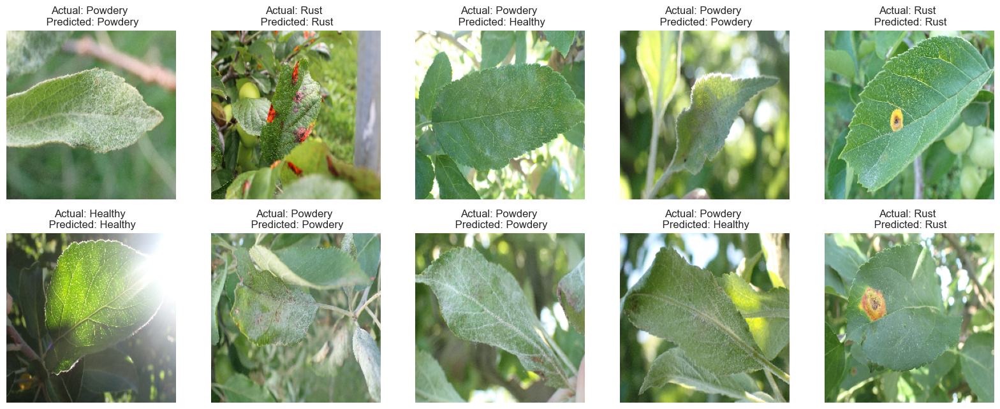

In [57]:
predict_leaf_disease(cnn_predictions)

<Axes: >

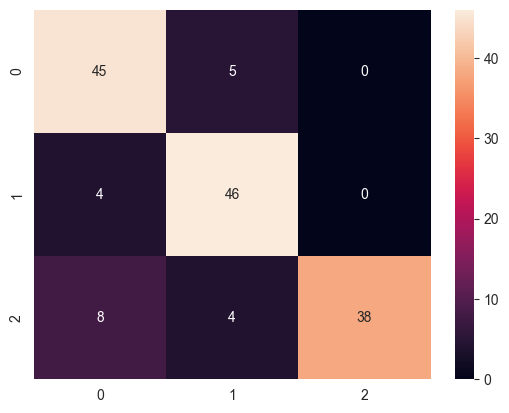

In [63]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(cnn_predictions, axis=1))
sns.heatmap(cm, annot=True)

## VGG16 Model

In [40]:
from keras.applications.vgg16 import VGG16
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in vgg16.layers:
    layer.trainable = False
# we will use the output of the last layer of the VGG16 model
flatten = Flatten()(vgg16.output)
# we will add a fully connected layer with 64 neurons and relu activation
dense = Dense(3, activation='softmax')(flatten)
model = tf.keras.models.Model(inputs=vgg16.input, outputs=dense)

### Model Summary

In [41]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

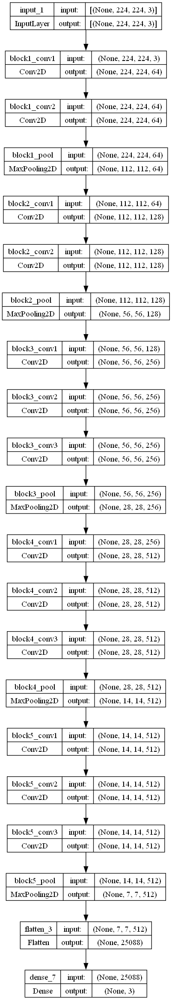

In [42]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [60]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
fit_model = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=16, verbose=1)

Epoch 1/10
83/83 [==============================] - 6s 69ms/step - loss: 0.5943 - accuracy: 0.7678 - val_loss: 0.2741 - val_accuracy: 0.9167 - lr: 0.0010
Epoch 2/10
83/83 [==============================] - 5s 66ms/step - loss: 0.1814 - accuracy: 0.9334 - val_loss: 0.2165 - val_accuracy: 0.9333 - lr: 0.0010
Epoch 3/10
83/83 [==============================] - 6s 68ms/step - loss: 0.0812 - accuracy: 0.9849 - val_loss: 0.2505 - val_accuracy: 0.9000 - lr: 0.0010
Epoch 4/10
83/83 [==============================] - 6s 72ms/step - loss: 0.0420 - accuracy: 0.9977 - val_loss: 0.2152 - val_accuracy: 0.8833 - lr: 0.0010
Epoch 5/10
83/83 [==============================] - 7s 84ms/step - loss: 0.0272 - accuracy: 1.0000 - val_loss: 0.1593 - val_accuracy: 0.9667 - lr: 0.0010
Epoch 6/10
83/83 [==============================] - 7s 87ms/step - loss: 0.0187 - accuracy: 1.0000 - val_loss: 0.1609 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 7/10
83/83 [==============================] - 7s 85ms/step - loss: 0.0

### Plotting Performance Metrics

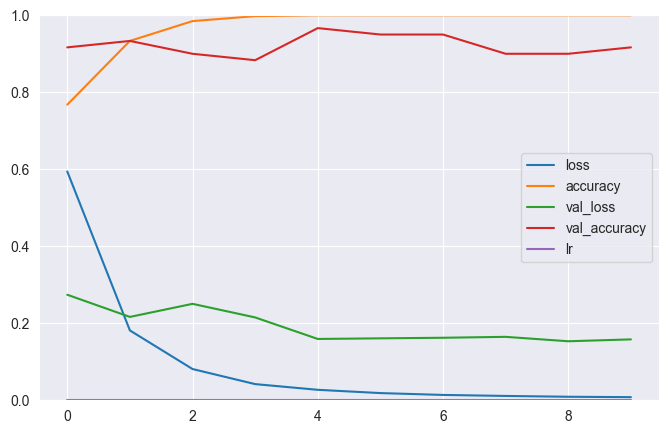

In [61]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [62]:
vgg16_predictions = model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
leaf_disease_accuracy = model.evaluate(X_test, y_test, verbose=1)
print("VGG 16 Accuracy: ", leaf_disease_accuracy)

5/5 [==============================] - 1s 123ms/step - loss: 0.4524 - accuracy: 0.8600
Leaf Disease Accuracy:  [0.4524189829826355, 0.8600000143051147]


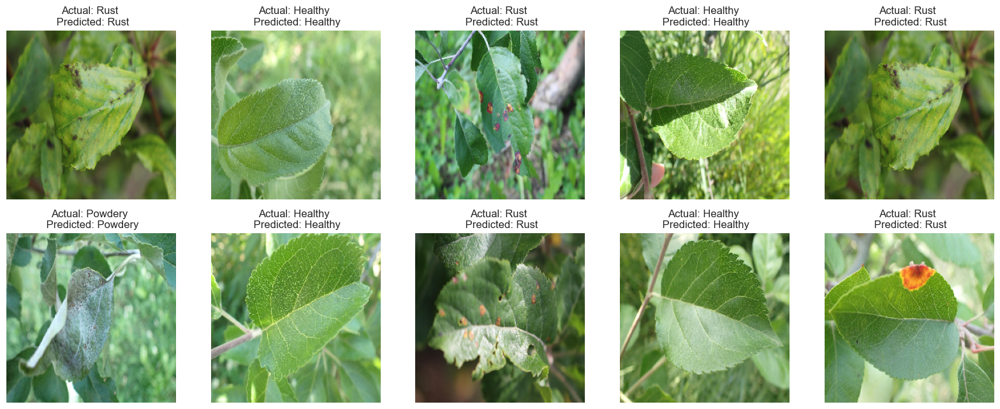

In [44]:
predict_leaf_disease(vgg16_predictions)

<Axes: >

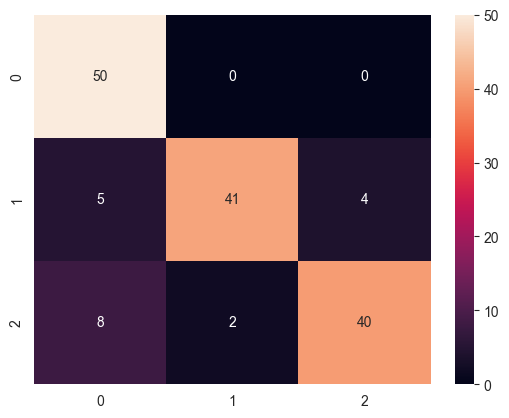

In [45]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(vgg16_predictions, axis=1))
sns.heatmap(cm, annot=True)

## VGG19 Model

In [10]:
from tensorflow.keras.applications import VGG19
vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

A local file was found, but it seems to be incomplete or outdated because the auto file hash does not match the original value of 253f8cb515780f3b799900260a226db6 so we will re-download the data.
80134624/80134624 [==============================] - 20s 0us/step


In [11]:
x = vgg19.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
vgg19_output = Dense(3, activation='softmax')(x)
vgg19_model = tf.keras.models.Model(inputs=vgg19.input, outputs=vgg19_output)
for layer in vgg19.layers:
    layer.trainable = False

In [12]:
vgg19_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [13]:
vgg19_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [14]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)
fit_model = vgg19_model.fit(X_train, y_train, epochs=50, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=32, verbose=1)

Epoch 1/50
42/42 [==============================] - 34s 473ms/step - loss: 0.9921 - accuracy: 0.5023 - val_loss: 0.6435 - val_accuracy: 0.8000 - lr: 0.0010
Epoch 2/50
42/42 [==============================] - 8s 203ms/step - loss: 0.7086 - accuracy: 0.7012 - val_loss: 0.5538 - val_accuracy: 0.8167 - lr: 0.0010
Epoch 3/50
42/42 [==============================] - 9s 204ms/step - loss: 0.6268 - accuracy: 0.7398 - val_loss: 0.4317 - val_accuracy: 0.8167 - lr: 0.0010
Epoch 4/50
42/42 [==============================] - 9s 220ms/step - loss: 0.5271 - accuracy: 0.7995 - val_loss: 0.3997 - val_accuracy: 0.8500 - lr: 0.0010
Epoch 5/50
42/42 [==============================] - 10s 249ms/step - loss: 0.4979 - accuracy: 0.8139 - val_loss: 0.3433 - val_accuracy: 0.8667 - lr: 0.0010
Epoch 6/50
42/42 [==============================] - 13s 313ms/step - loss: 0.4199 - accuracy: 0.8427 - val_loss: 0.3369 - val_accuracy: 0.8667 - lr: 0.0010
Epoch 7/50
42/42 [==============================] - 14s 323ms/step 

### Plotting Performance Metrics

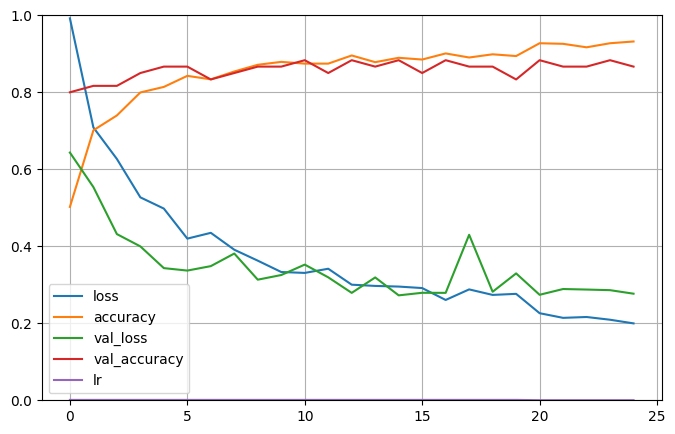

In [15]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [16]:
vgg19_predictions = vgg19_model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
vgg19_accuracy = vgg19_model.evaluate(X_test, y_test, verbose=1)
print("VGG19 Accuracy: ", vgg19_accuracy)

5/5 [==============================] - 4s 816ms/step - loss: 0.3778 - accuracy: 0.8933
VGG19 Accuracy:  [0.37778499722480774, 0.8933333158493042]


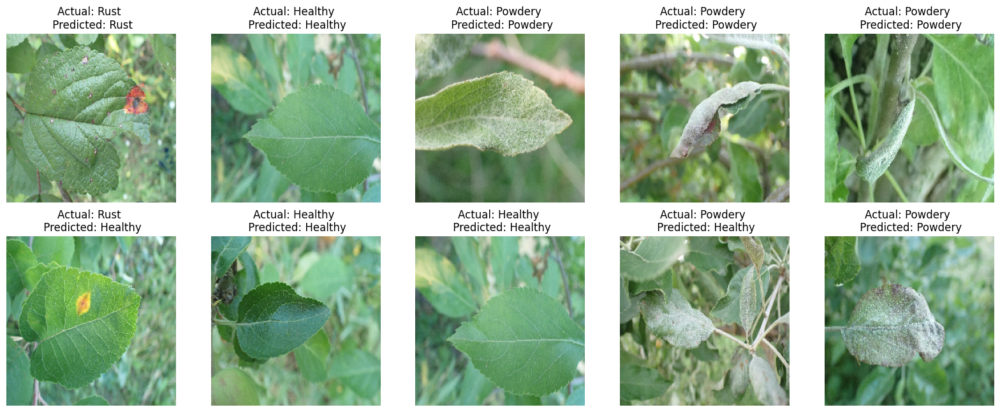

In [17]:
predict_leaf_disease(vgg19_predictions)

## MobileNet Model

In [45]:
from keras.applications.mobilenet import MobileNet
mobilenet = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3), alpha=1.0, pooling='max', depth_multiplier=1, dropout=1e-3, input_tensor=None, classifier_activation='softmax')
for layer in mobilenet.layers:
    layer.trainable = False


In [46]:
mobilenet_model = Sequential(
    [
        mobilenet,
        Dense(3, activation='softmax')
    ]
)

In [47]:
mobilenet_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 dense_8 (Dense)             (None, 3)                 3075      
                                                                 
Total params: 3,231,939
Trainable params: 3,075
Non-trainable params: 3,228,864
_________________________________________________________________


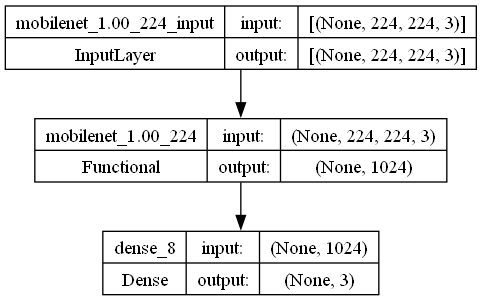

In [48]:
plot_model(mobilenet_model, show_shapes=True, show_layer_names=True)

In [67]:
mobilenet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [68]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
fit_model = mobilenet_model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=16, verbose=1)

Epoch 1/10
83/83 [==============================] - 6s 39ms/step - loss: 1.3538 - accuracy: 0.6831 - val_loss: 0.3083 - val_accuracy: 0.9000 - lr: 0.0010
Epoch 2/10
83/83 [==============================] - 2s 28ms/step - loss: 0.2866 - accuracy: 0.9054 - val_loss: 0.2684 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 3/10
83/83 [==============================] - 2s 28ms/step - loss: 0.1895 - accuracy: 0.9349 - val_loss: 0.2048 - val_accuracy: 0.9000 - lr: 0.0010
Epoch 4/10
83/83 [==============================] - 2s 28ms/step - loss: 0.1225 - accuracy: 0.9584 - val_loss: 0.1661 - val_accuracy: 0.9333 - lr: 0.0010
Epoch 5/10
83/83 [==============================] - 2s 29ms/step - loss: 0.0818 - accuracy: 0.9697 - val_loss: 0.1298 - val_accuracy: 0.9333 - lr: 0.0010
Epoch 6/10
83/83 [==============================] - 2s 30ms/step - loss: 0.0541 - accuracy: 0.9803 - val_loss: 0.1261 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 7/10
83/83 [==============================] - 2s 30ms/step - loss: 0.0

### Plotting Performance Metrics

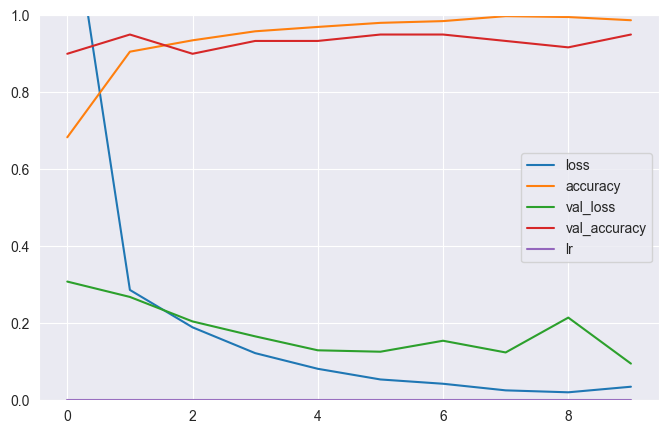

In [69]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [70]:
mobilenet_predictions = mobilenet_model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
mobilenet_accuracy = mobilenet_model.evaluate(X_test, y_test, verbose=1)
print("MobileNet Accuracy: ", mobilenet_accuracy)

5/5 [==============================] - 0s 42ms/step - loss: 0.3257 - accuracy: 0.9133
MobileNet Accuracy:  [0.32574892044067383, 0.9133333563804626]


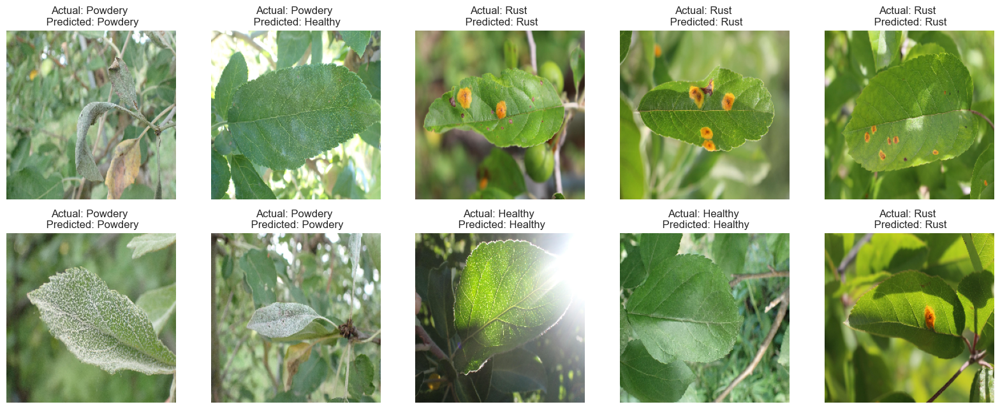

In [71]:
predict_leaf_disease(mobilenet_predictions)

<Axes: >

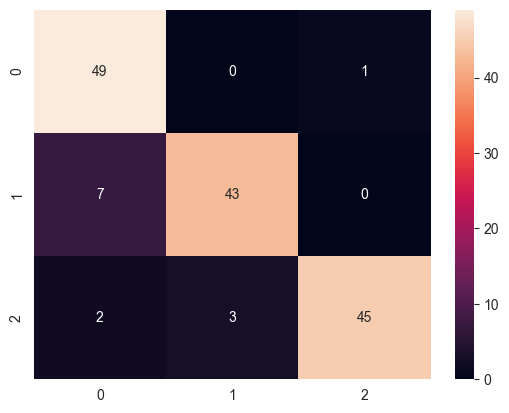

In [72]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(mobilenet_predictions, axis=1))
sns.heatmap(cm, annot=True)

## InceptionResNetV2 Model

In [49]:
from keras.applications.inception_resnet_v2 import InceptionResNetV2
inception_resnet_v2 = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3), pooling='max')
model = inception_resnet_v2.output
model = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(model)
model = Dense(1024, activation='relu')(model)
model = Dropout(0.5)(model)
inception_resnet_v2_model = Dense(3, activation='softmax')(model)

In [50]:
inception_resnet_v2_model = tf.keras.models.Model(inputs=inception_resnet_v2.input, outputs=inception_resnet_v2_model)

In [51]:
inception_resnet_v2_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_9 (Conv2D)              (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 111, 111, 32  96         ['conv2d_9[0][0]']               
 rmalization)                   )                                                           

In [13]:
inception_resnet_v2_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [14]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
fit_model = inception_resnet_v2_model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=16, verbose=1)

Epoch 1/10
83/83 [==============================] - 68s 520ms/step - loss: 0.7581 - accuracy: 0.8828 - val_loss: 15.3184 - val_accuracy: 0.6500 - lr: 0.0010
Epoch 2/10
83/83 [==============================] - 40s 476ms/step - loss: 0.2774 - accuracy: 0.9455 - val_loss: 0.4630 - val_accuracy: 0.9833 - lr: 0.0010
Epoch 3/10
83/83 [==============================] - 43s 517ms/step - loss: 0.6688 - accuracy: 0.9433 - val_loss: 83.4666 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 4/10
83/83 [==============================] - 77s 937ms/step - loss: 0.4853 - accuracy: 0.9463 - val_loss: 8.7566 - val_accuracy: 0.8333 - lr: 0.0010
Epoch 5/10
83/83 [==============================] - 178s 2s/step - loss: 0.4323 - accuracy: 0.9622 - val_loss: 0.4407 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 6/10
83/83 [==============================] - 215s 3s/step - loss: 0.6306 - accuracy: 0.9387 - val_loss: 307.2386 - val_accuracy: 0.4000 - lr: 0.0010
Epoch 7/10
83/83 [==============================] - 90s 1s/step 

### Plotting Performance Metrics

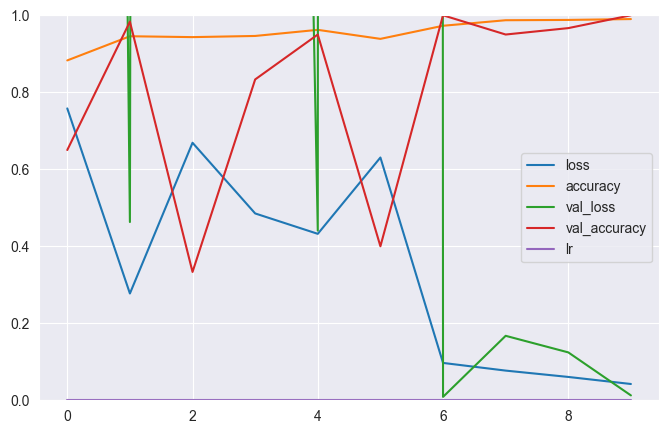

In [15]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [17]:
inception_resnet_v2_predictions = inception_resnet_v2_model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
inception_resnet_v2_accuracy = inception_resnet_v2_model.evaluate(X_test, y_test, verbose=1)
print("InceptionResNetV2 Accuracy: ", inception_resnet_v2_accuracy)

5/5 [==============================] - 1s 168ms/step - loss: 0.1281 - accuracy: 0.9800
InceptionResNetV2 Accuracy:  [0.12813185155391693, 0.9800000190734863]


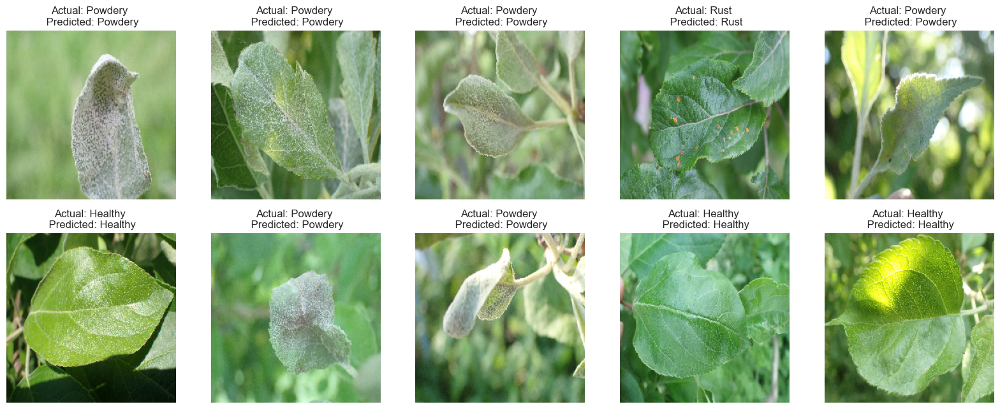

In [20]:
predict_leaf_disease(inception_resnet_v2_predictions)

### Confusion Matrix

<Axes: >

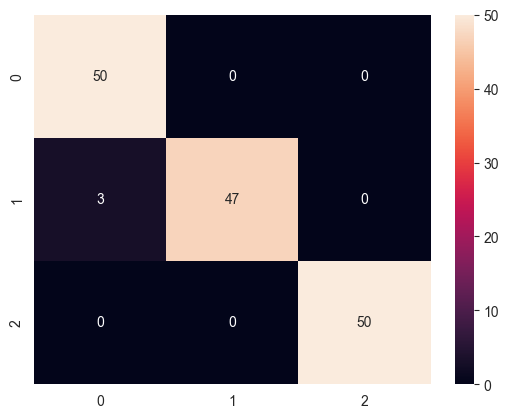

In [22]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(inception_resnet_v2_predictions, axis=1))
sns.heatmap(cm, annot=True)

## LeNet Model

In [24]:
lenet_model = Sequential([
    # First set of CONV => RELU => POOL
    Conv2D(6, (5, 5), padding="same", input_shape=(224, 224, 3), kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Second set of CONV => RELU => POOL
    Conv2D(16, (5, 5), padding="same", kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Activation("relu"),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Flatten and Dense layers
    Flatten(),
    Dense(120, kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Activation("relu"),
    Dropout(0.5),

    Dense(84, kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Activation("relu"),
    Dropout(0.5),

    # Softmax classifier
    Dense(3),
    Activation("softmax")
])

In [25]:
lenet_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 224, 224, 6)       456       
                                                                 
 batch_normalization_4 (Batc  (None, 224, 224, 6)      24        
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 224, 224, 6)       0         
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 112, 112, 6)      0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 112, 112, 16)      2416      
                                                                 
 batch_normalization_5 (Batc  (None, 112, 112, 16)    

In [26]:
lenet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [27]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
fit_model = lenet_model.fit(X_train, y_train, epochs=50, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=32, verbose=1)

Epoch 1/50
42/42 [==============================] - 3s 45ms/step - loss: 5.1404 - accuracy: 0.5741 - val_loss: 4.9117 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 2/50
42/42 [==============================] - 1s 33ms/step - loss: 3.7154 - accuracy: 0.7511 - val_loss: 4.2408 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 3/50
42/42 [==============================] - 1s 33ms/step - loss: 2.6556 - accuracy: 0.7943 - val_loss: 3.5889 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 4/50
42/42 [==============================] - 1s 33ms/step - loss: 2.1352 - accuracy: 0.8336 - val_loss: 2.9918 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 5/50
42/42 [==============================] - 1s 33ms/step - loss: 1.9846 - accuracy: 0.8540 - val_loss: 2.4552 - val_accuracy: 0.5333 - lr: 0.0010
Epoch 6/50
42/42 [==============================] - 1s 33ms/step - loss: 1.8281 - accuracy: 0.8873 - val_loss: 2.3986 - val_accuracy: 0.5833 - lr: 0.0010
Epoch 7/50
42/42 [==============================] - 1s 34ms/step - loss: 2.2

### Plotting Performance Metrics

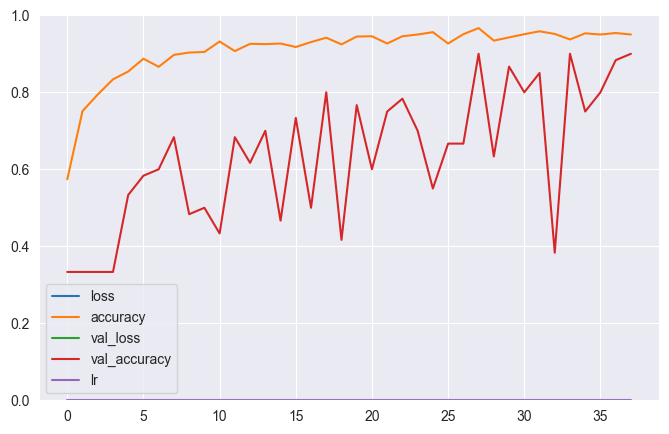

In [28]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [29]:
lenet_predictions = lenet_model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
lenet_accuracy = lenet_model.evaluate(X_test, y_test, verbose=1)
print("LeNet Accuracy: ", lenet_accuracy)

5/5 [==============================] - 0s 16ms/step - loss: 1.3438 - accuracy: 0.8733
LeNet Accuracy:  [1.3437618017196655, 0.8733333349227905]


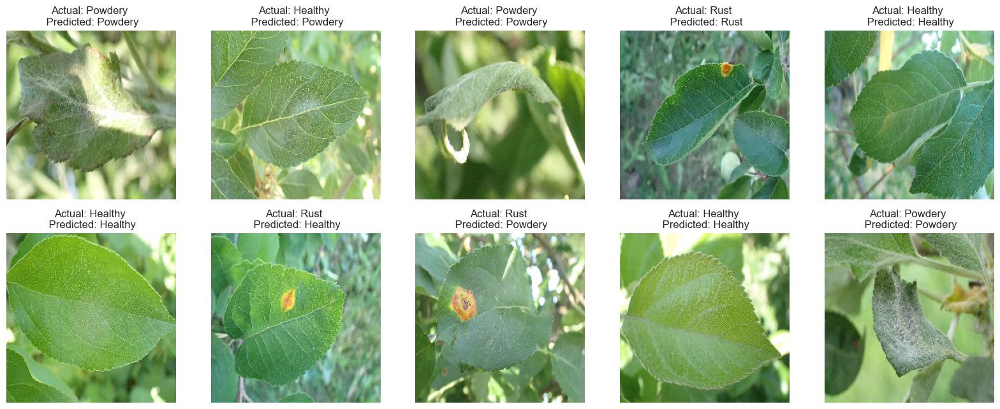

In [30]:
predict_leaf_disease(lenet_predictions)

### Confusion Matrix

<Axes: >

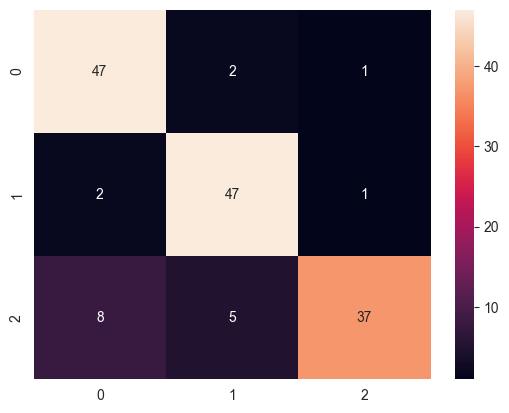

In [31]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(lenet_predictions, axis=1))
sns.heatmap(cm, annot=True)

## AlexNet Model

In [32]:
alexnet_model = Sequential([
    Conv2D(96, (11, 11), strides=(4, 4), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((3, 3), strides=(2, 2)),
    BatchNormalization(),

    Conv2D(256, (5, 5), activation='relu', padding='same'),
    MaxPooling2D((3, 3), strides=(2, 2)),
    BatchNormalization(),

    Conv2D(384, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(384, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((3, 3), strides=(2, 2)),
    BatchNormalization(),

    Flatten(),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    BatchNormalization(),

    Dense(4096, activation='relu'),
    Dropout(0.5),
    BatchNormalization(),

    Dense(3, activation='softmax')
])

In [33]:
alexnet_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 54, 54, 96)        34944     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 26, 26, 96)       0         
 2D)                                                             
                                                                 
 batch_normalization_8 (Batc  (None, 26, 26, 96)       384       
 hNormalization)                                                 
                                                                 
 conv2d_8 (Conv2D)           (None, 26, 26, 256)       614656    
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 12, 12, 256)      0         
 2D)                                                             
                                                      

In [34]:
alexnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [35]:
early_stopping = EarlyStopping(monitor='val_loss', patience=8)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
fit_model = alexnet_model.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=16, verbose=1)

Epoch 1/20
83/83 [==============================] - 7s 59ms/step - loss: 1.6119 - accuracy: 0.6619 - val_loss: 20.6973 - val_accuracy: 0.3333 - lr: 0.0010
Epoch 2/20
83/83 [==============================] - 3s 42ms/step - loss: 0.8483 - accuracy: 0.7549 - val_loss: 5.5768 - val_accuracy: 0.4333 - lr: 0.0010
Epoch 3/20
83/83 [==============================] - 3s 42ms/step - loss: 0.6491 - accuracy: 0.8056 - val_loss: 4.1101 - val_accuracy: 0.5667 - lr: 0.0010
Epoch 4/20
83/83 [==============================] - 4s 42ms/step - loss: 0.5070 - accuracy: 0.8434 - val_loss: 7.4993 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 5/20
83/83 [==============================] - 3s 42ms/step - loss: 0.4417 - accuracy: 0.8616 - val_loss: 3.8642 - val_accuracy: 0.6500 - lr: 0.0010
Epoch 6/20
83/83 [==============================] - 3s 42ms/step - loss: 0.4038 - accuracy: 0.8722 - val_loss: 2.3711 - val_accuracy: 0.6833 - lr: 0.0010
Epoch 7/20
83/83 [==============================] - 3s 42ms/step - loss: 0.

### Plotting Performance Metrics

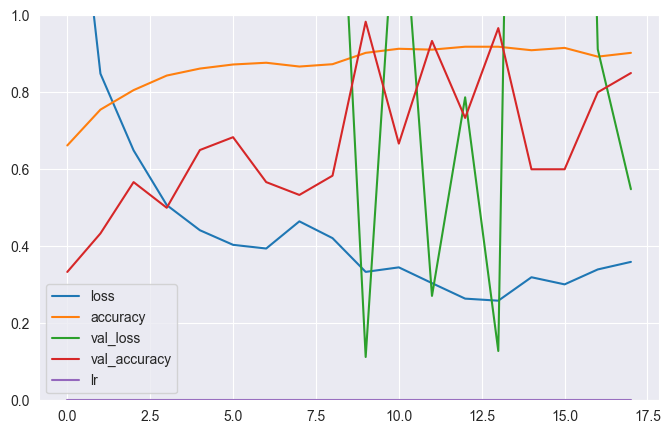

In [36]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [37]:
alexnet_predictions = alexnet_model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
alexnet_accuracy = alexnet_model.evaluate(X_test, y_test, verbose=1)
print("AlexNet Accuracy: ", alexnet_accuracy)

5/5 [==============================] - 0s 20ms/step - loss: 0.6312 - accuracy: 0.8800
AlexNet Accuracy:  [0.6311802268028259, 0.8799999952316284]


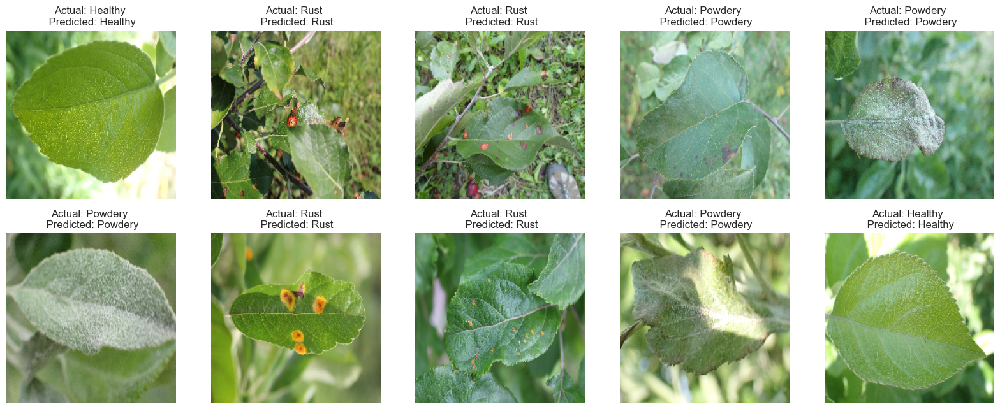

In [38]:
predict_leaf_disease(alexnet_predictions)

### Confusion Matrix

<Axes: >

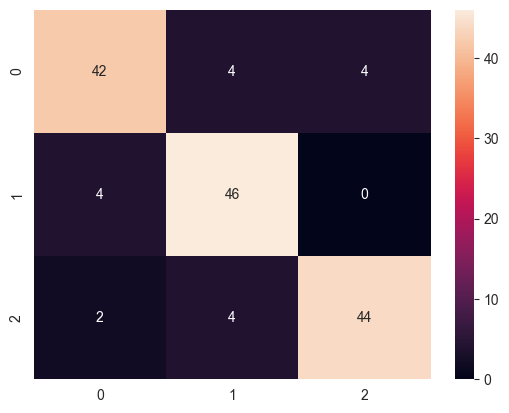

In [39]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(alexnet_predictions, axis=1))
sns.heatmap(cm, annot=True)

## GoogLeNet Model

In [40]:
from tensorflow.keras.applications import InceptionV3
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(3, activation='softmax')(x)
googlenet_model = tf.keras.models.Model(inputs=base_model.input, outputs=output)
for layer in base_model.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 19s 0us/step


In [41]:
googlenet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_12 (Conv2D)             (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_15 (BatchN  (None, 111, 111, 32  96         ['conv2d_12[0][0]']              
 ormalization)                  )                                                             

In [43]:
googlenet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [44]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)
fit_model = googlenet_model.fit(X_train, y_train, epochs=50, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr], batch_size=32, verbose=1)

Epoch 1/50
42/42 [==============================] - 13s 179ms/step - loss: 0.9337 - accuracy: 0.7723 - val_loss: 0.0870 - val_accuracy: 0.9833 - lr: 0.0010
Epoch 2/50
42/42 [==============================] - 4s 83ms/step - loss: 0.1931 - accuracy: 0.9289 - val_loss: 0.1269 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 3/50
42/42 [==============================] - 4s 83ms/step - loss: 0.1554 - accuracy: 0.9486 - val_loss: 0.0968 - val_accuracy: 0.9667 - lr: 0.0010
Epoch 4/50
42/42 [==============================] - 4s 95ms/step - loss: 0.1260 - accuracy: 0.9607 - val_loss: 0.0715 - val_accuracy: 0.9833 - lr: 0.0010
Epoch 5/50
42/42 [==============================] - 4s 99ms/step - loss: 0.1393 - accuracy: 0.9531 - val_loss: 0.1206 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 6/50
42/42 [==============================] - 4s 103ms/step - loss: 0.1418 - accuracy: 0.9493 - val_loss: 0.1229 - val_accuracy: 0.9167 - lr: 0.0010
Epoch 7/50
42/42 [==============================] - 4s 104ms/step - loss:

### Plotting Performance Metrics

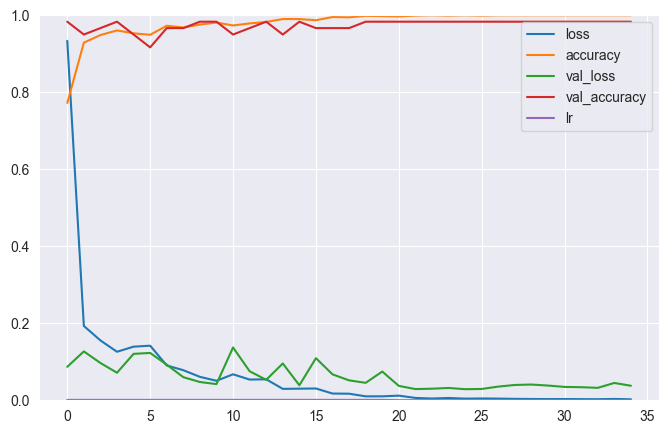

In [45]:
pd.DataFrame(fit_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### Predictions

In [46]:
googlenet_predictions = googlenet_model.predict(X_test, verbose=1) # we set verbose to 1 to see the progress
googlenet_accuracy = googlenet_model.evaluate(X_test, y_test, verbose=1)
print("GoogLeNet Accuracy: ", googlenet_accuracy)

5/5 [==============================] - 1s 98ms/step - loss: 0.2998 - accuracy: 0.9400
GoogLeNet Accuracy:  [0.299830824136734, 0.9399999976158142]


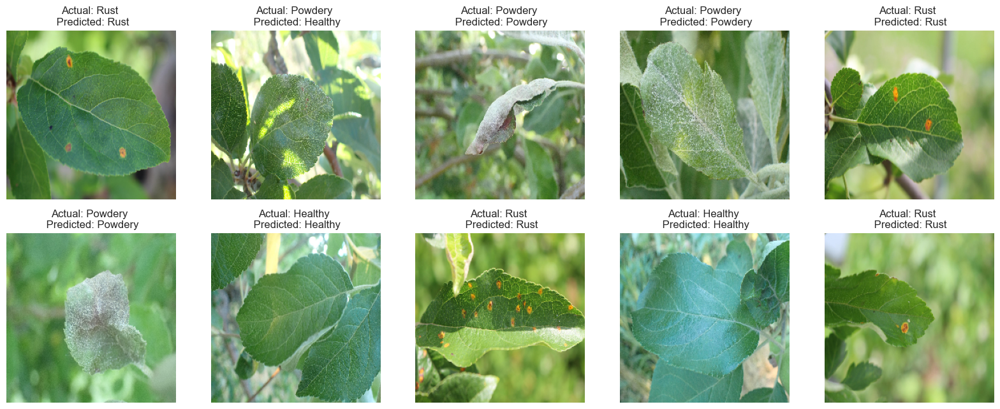

In [47]:
predict_leaf_disease(googlenet_predictions)

### Confusion Matrix

<Axes: >

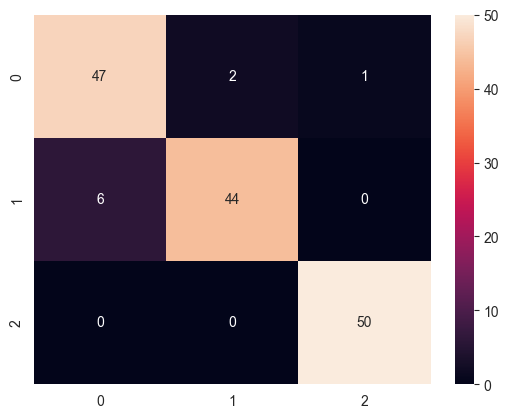

In [48]:
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(googlenet_predictions, axis=1))
sns.heatmap(cm, annot=True)